# Quickstart: Transient path tracing

## Overview
In this tutorial, you will render your very first **transient image** using `mitransient`!

<div class="admonition important alert alert-block alert-success">

🚀 **You will learn how to:**

<ul>
  <li>
  
  Import `mitransient`
  
  </li>
  <li>
  
  Setup and render a Cornell Box scene with a transient path tracer
  
  </li>
  <li>
  
  Visualize the output video, steady state image, and time-gated images
  
  </li>
</ul>

</div>

### Importing `mitransient`
Before importing `mitransient`, you need to import Mitsuba 3 and set a variant (here we use `llvm_ad_rgb`). Only if you want to use more variants, you will need to compile Mitsuba 3 (not `mitransient`) yourself. And you will need to add the compilation folder to the `PYTHONPATH` (see the commented code for how to do that)

<div class="admonition important alert alert-block alert-warning">

For many cases, `mitransient` requires the use of a `llvm_*` or `cuda_*` variant, so we don't recommend using `scalar_rgb`. It will work with any `llvm_*` or `cuda_*` variant, and for most use cases `llvm_ad_rgb` or `cuda_ad_rgb` is enough. [You can see a full explanation of mitsuba's variants here.](https://mitsuba.readthedocs.io/en/stable/src/key_topics/variants.html)

**If you have a GPU we really recommend using `cuda_*` variants as they'll make the process much faster.**

</div>

In [1]:
# If you have compiled Mitsuba 3 yourself, you will need to specify the path
# to the compilation folder
# import sys
# sys.path.insert(0, '<mitsuba-path>/mitsuba3/build/python')
import mitsuba as mi
# To set a variant, you need to have set it in the mitsuba.conf file
# https://mitsuba.readthedocs.io/en/latest/src/key_topics/variants.html
mi.set_variant('llvm_ad_rgb')

import mitransient as mitr

print('Using mitsuba version:', mi.__version__)
print('Using mitransient version:', mitr.__version__)

Using mitsuba version: 3.7.0
Using mitransient version: 1.2.0


We use the short alias `mitr` for `mitransient` for improved code readibility.

### Setup the Cornell Box scene

Scene data is represented using plugins. Each plugin can model geometry, materials, camera, lights, etc. Mitsuba 3 uses a XML format to represent the content of their scenes as a hierarchy of plugins (for example, the `sensor` plugin is a camera that contains a `film` plugin that stores the resulting image). You can check the `cbox_diffuse.xml` to see how it's structured. Concretely, `mitransient` provides new plugins that work in the transient domain such as `transient_path`, `transient_hdr_film`, etc.

There are two main ways to setup the scene. Both ways accomplish the same goals.

1. `mi.load_dict(d)`: Takes a Python dictionary object `d`. We provide a `mitr.cornell_box()` function which contains a Cornell Box scene with a transient path tracer ready to use.
2. `mi.load_file(f)`: Takes a path to an XML file that contains the [scene description as described by the Mitsuba format](https://mitsuba.readthedocs.io/en/stable/src/key_topics/scene_format.html).

You might want to use one or the other depending if you prefer editing the scene in Python code, or in an XML file.

<div class="admonition important alert alert-block alert-warning">

Note that `mi.cornell_box()` and `mitr.cornell_box()` are different. The first one uses a standard path tracer, and the second one uses a transient path tracer. We use the second one for this demonstration.

</div>

In [2]:
# Load a Python dict object
d = mitr.cornell_box()
print(d)
scene = mi.load_dict(d)

# You could also load the scene from an XML file
# import os
# scene = mi.load_file(os.path.abspath('cornell-box/cbox_diffuse.xml'))

{'type': 'scene', 'integrator': {'type': 'transient_path', 'camera_unwarp': False, 'max_depth': 8, 'temporal_filter': 'box', 'gaussian_stddev': 2.0}, 'sensor': {'type': 'perspective', 'fov_axis': 'smaller', 'near_clip': 0.001, 'far_clip': 100.0, 'focus_distance': 1000, 'fov': 39.3077, 'to_world': Transform[
  matrix=[[-1, 0, 0, 0],
          [0, 1, 0, 0],
          [0, 0, -1, 3.9],
          [0, 0, 0, 1]],
  inverse_transpose=[[-1, 0, 0, 0],
                     [0, 1, 0, 0],
                     [0, 0, -1, 0],
                     [0, 0, 3.9, 1]]
], 'sampler': {'type': 'independent', 'sample_count': 256}, 'film': {'type': 'transient_hdr_film', 'width': 256, 'height': 256, 'rfilter': {'type': 'box'}, 'temporal_bins': 300, 'start_opl': 3.5, 'bin_width_opl': 0.02}}, 'white': {'type': 'diffuse', 'reflectance': {'type': 'rgb', 'value': [0.885809, 0.698859, 0.666422]}}, 'green': {'type': 'diffuse', 'reflectance': {'type': 'rgb', 'value': [0.105421, 0.37798, 0.076425]}}, 'red': {'type': 'dif

The only difference with a conventional (steady state) scene is that a transient scene must use a [transient integrator](https://mitransient.readthedocs.io/en/latest/generated/plugin_reference/section_integrators.html#integrators) and a [transient film](https://mitransient.readthedocs.io/en/latest/generated/plugin_reference/section_films.html#films).

### Render the scene in steady and transient domain

<div class="admonition important alert alert-block alert-warning">

Mitsuba 3 and `mitransient` work with Dr.JIT, which has lazy evaluation.
That means the actual image/video will not be computed until you use it.
As such, this cell should take &lt;1s to execute

</div>

In [3]:
data_steady, data_transient = mi.render(scene, spp=1024)

In [4]:
print(data_steady.shape, data_transient.shape)

(256, 256, 3) (256, 256, 300, 3)


The result is:
1) A steady state image `data_steady` with dimensions (width, height, channels)
2) A transient image `data_transient` with dimensions (width, height, time, channels)

`data_steady` would be the result of a conventional (non-transient) render i.e. `data_steady = data_transient.sum(axis=2)`

### Visualize the steady and transient image
We provide different functions so you can visualize your data in a Jupyter notebook

<div class="admonition important alert alert-block alert-warning">
You will see that this cell takes some seconds to execute (~10s to ~1min)
In reality most of this time is spent rendering the transient image, as was explained before.
</div>

In [5]:
# Plot the computed steady image
mi.util.convert_to_bitmap(data_steady)

Bitmap[
  pixel_format = rgb,
  component_format = uint8,
  size = [256, 256],
  srgb_gamma = 1,
  struct = Struct<3>[
    uint8 R; // @0, normalized, gamma, premultiplied alpha
    uint8 G; // @1, normalized, gamma, premultiplied alpha
    uint8 B; // @2, normalized, gamma, premultiplied alpha
  ],
  data = [ 192 KiB of image data ]
]

In [6]:
# Plot the computed transient image as a video
data_transient_tonemapped = mitr.vis.tonemap_transient(data_transient)

mitr.vis.show_video(
    data_transient_tonemapped,
    axis_video=2,
)

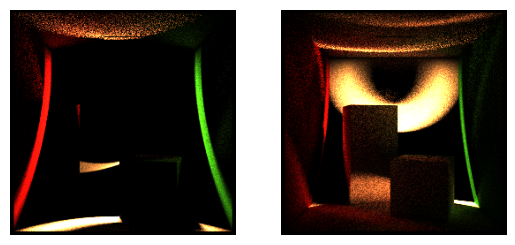

In [7]:
# Plot some frames of the computed transient image
import matplotlib.pyplot as plt

data_transient_tonemapped[data_transient_tonemapped > 1] = 1

plt.subplot(1, 2, 1)
plt.axis("off")
plt.imshow(data_transient_tonemapped[:, :, 100])  # frame 100 (video has 300 frames)
plt.subplot(1, 2, 2)
plt.axis("off")
plt.imshow(data_transient_tonemapped[:, :, 140])  # frame 140 (video has 300 frames)
plt.show()